<a href="https://colab.research.google.com/github/sharjeelnawaz8182/face_recognition_using_moment_invariant/blob/main/face_recognition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip3 install mtcnn
from mtcnn.mtcnn import MTCNN
from PIL import Image,ImageOps
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2
from skimage.measure import moments_hu
from scipy.spatial import distance

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
image_path = "/content/drive/My Drive/"
import tensorflow as tf

def loadImages(path):
    '''Put files into lists and return them as one list with all images 
     in the folder'''
    image_files = sorted([os.path.join(path, '2', file)
                          for file in os.listdir(path + "/2")
                          if file.endswith('.JPG')])
    return image_files
def loadImagest(path):
    '''Put files into lists and return them as one list with all images 
     in the folder'''
    image_files = sorted([os.path.join(path, '1', file)
                          for file in os.listdir(path + "/1")
                          if file.endswith('.JPG')])
    return image_files

In [ ]:
dataset=loadImages(image_path)

In [ ]:
dataset

['/content/drive/My Drive/2/DSC07622.JPG',
 '/content/drive/My Drive/2/DSC07694.JPG',
 '/content/drive/My Drive/2/DSC_0173.JPG',
 '/content/drive/My Drive/2/DSC_0197.JPG',
 '/content/drive/My Drive/2/DSC_0214.JPG',
 '/content/drive/My Drive/2/DSC_0245.JPG',
 '/content/drive/My Drive/2/DSC_0324.JPG',
 '/content/drive/My Drive/2/DSC_0391.JPG',
 '/content/drive/My Drive/2/DSC_0392.JPG',
 '/content/drive/My Drive/2/DSC_0480.JPG',
 '/content/drive/My Drive/2/DSC_0482.JPG',
 '/content/drive/My Drive/2/DSC_0571.JPG']

In [ ]:
def display(a, b, title1 = "Original", title2 = "Edited"):
    plt.subplot(121), plt.imshow(a), plt.title(title1)
    plt.xticks([]), plt.yticks([])
    plt.subplot(122), plt.imshow(b), plt.title(title2)
    plt.xticks([]), plt.yticks([])
    plt.show()

# Display one image
def display_one(a, title1 = "Original"):
    plt.imshow(a), plt.title(title1)
    plt.show()


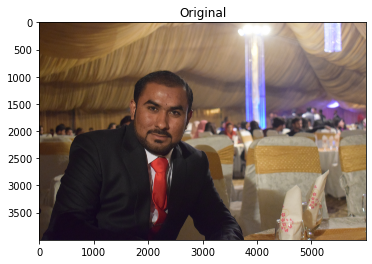

In [ ]:
image=Image.open(dataset[4])
display_one(image)

In [ ]:
gray=image.convert('LA')

In [ ]:
image.mode

'RGB'

In [ ]:
image = image.convert('RGB')
# convert to array
pixels = np.asarray(image)
detector = MTCNN()
# detect faces in the image
results = detector.detect_faces(pixels)
# extract the bounding box from the first face
x1, y1, width, height = results[0]['box']
w=width/100
h=height/100
w=w*3
h=h*3
# bug fix
x1, y1 = abs(int(x1-w)), abs(int(y1-h))
x2, y2 = int(x1 + width+w),int( y1 + height+h)

In [ ]:
face = pixels[y1:y2, x1:x2]
# resize pixels to the model size
find_image = Image.fromarray(face)
red, green, blue = find_image.split()

In [ ]:
import pywt

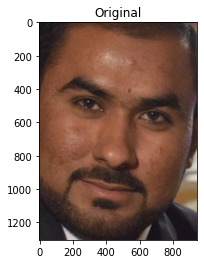

In [ ]:
display_one(find_image)

In [ ]:
coeffs2 = pywt.wavedec2(red,'haar',level=1)
LL, (red_LH, red_HL, red_HH) = coeffs2
coeffs2 = pywt.wavedec2(green,'haar',level=1)
LL, (green_LH, green_HL, green_HH) = coeffs2
coeffs2 = pywt.wavedec2(blue,'haar',level=1)
LL, (blue_LH,blue_HL,blue_HH) = coeffs2

In [ ]:
pic=Image.fromarray(np.uint8(np.concatenate((red_LH,green_LH,blue_LH),axis=1))*255.999)


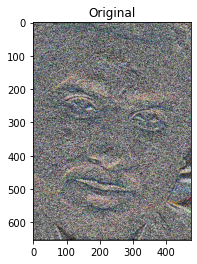

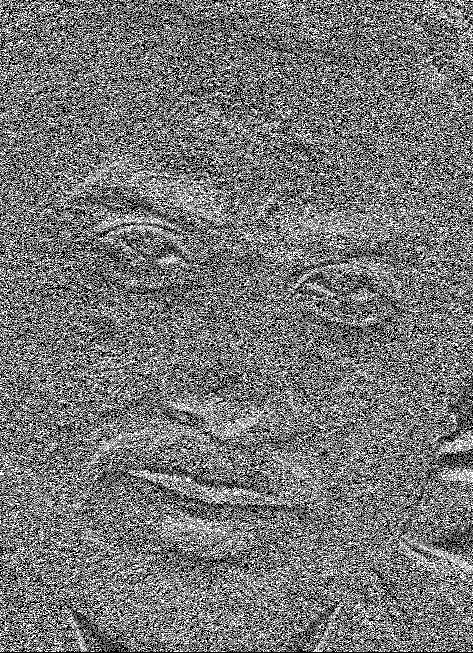

In [ ]:
LH=Image.merge('RGB',(Image.fromarray(np.uint8(red_LH*255.999)),Image.fromarray(np.uint8(green_LH*255.999)),Image.fromarray(np.uint8(blue_LH*255.999))))
display_one(LH)
LH_GRAY=ImageOps.grayscale(LH)
LH_GRAY

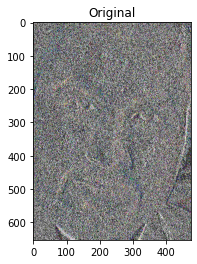

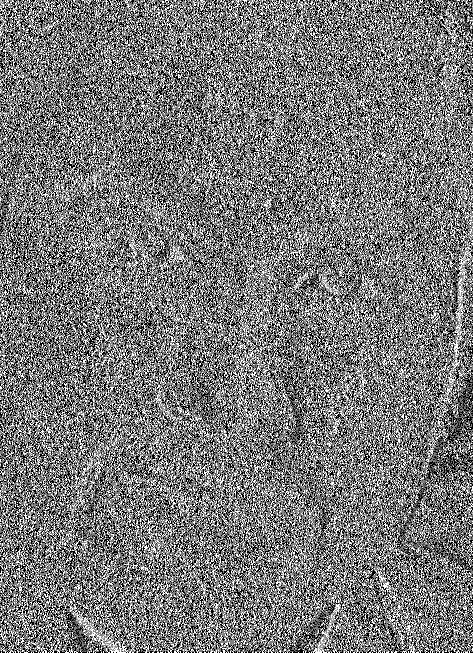

In [ ]:
HL=Image.merge('RGB',(Image.fromarray(np.uint8(red_HL*255.999)),Image.fromarray(np.uint8(green_HL*255.999)),Image.fromarray(np.uint8(blue_HL*255.999))))
display_one(HL)
HL_GRAY=ImageOps.grayscale(HL)
HL_GRAY

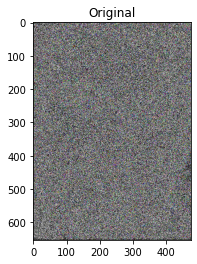

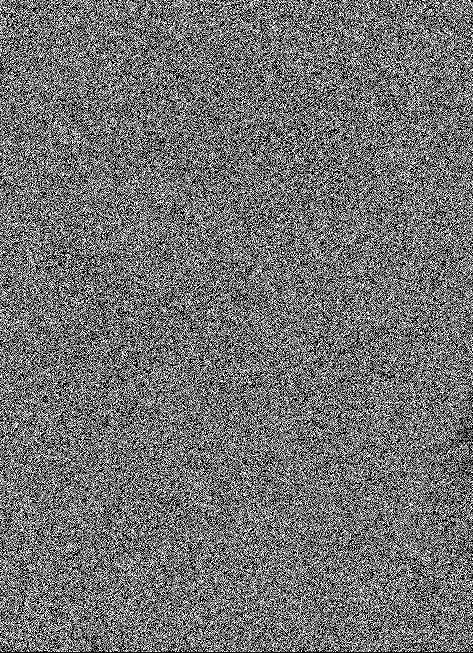

In [ ]:
HH=Image.merge('RGB',(Image.fromarray(np.uint8(red_HH*255.999)),Image.fromarray(np.uint8(green_HH*255.999)),Image.fromarray(np.uint8(blue_HH*255.999))))
display_one(HH)
HH_GRAY=ImageOps.grayscale(HH)
HH_GRAY

In [ ]:
'''
coeffs2 = pywt.wavedec2(find_image,'haar',level=1)
LL, (LH, HL, HH) = coeffs2
display_one(LH[:,:,0])
display_one(HH[:,:,0])
display_one(HL[:,:,0])
LH.shape'''

"\ncoeffs2 = pywt.wavedec2(find_image,'haar',level=1)\nLL, (LH, HL, HH) = coeffs2\ndisplay_one(LH[:,:,0])\ndisplay_one(HH[:,:,0])\ndisplay_one(HL[:,:,0])\nLH.shape"

In [ ]:
size=find_image.size

In [ ]:
pil_image =HL_GRAY
hl = cv2.cvtColor(np.array(pil_image), cv2.COLOR_BAYER_BG2GRAY)
pil_image =HH_GRAY
hh = cv2.cvtColor(np.array(pil_image), cv2.COLOR_BAYER_BG2GRAY)
pil_image =LH_GRAY
lh = cv2.cvtColor(np.array(pil_image), cv2.COLOR_BAYER_BG2GRAY)

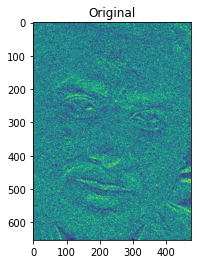

In [ ]:
display_one(lh)

In [ ]:
hl=cv2.resize(hl,size, interpolation = cv2.INTER_AREA)
hh=cv2.resize(hh,size, interpolation = cv2.INTER_AREA)
lh=cv2.resize(lh,size, interpolation = cv2.INTER_AREA)

In [ ]:
hl.shape

(1305, 946)

In [ ]:
size

(946, 1305)

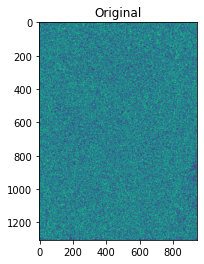

In [ ]:
display_one(hh)

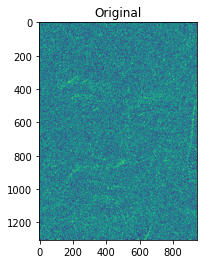

In [ ]:
tt=lh+hl+hh
A = np.double(tt)
out = np.zeros(A.shape, np.double)
normalized_image1 = cv2.normalize(A, out,1, 0.0, cv2.NORM_MINMAX)
display_one(normalized_image1)

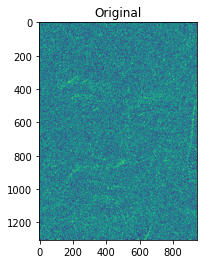

In [ ]:
tt=np.abs(lh)+np.abs(hl)+np.abs(hh)
A = np.double(tt)
out = np.zeros(A.shape, np.double)
normalized_image2 = cv2.normalize(A, out,1, 0.0, cv2.NORM_MINMAX)
display_one(normalized_image2)

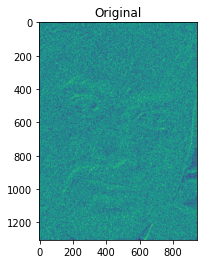

In [ ]:

A = np.double(lh)
out = np.zeros(A.shape, np.double)
s1 = cv2.normalize(A, out,1, 0.0, cv2.NORM_MINMAX)
A = np.double(hl)
out = np.zeros(A.shape, np.double)
s2 = cv2.normalize(A, out,1, 0.0, cv2.NORM_MINMAX)
A = np.double(hh)
out = np.zeros(A.shape, np.double)
s3 = cv2.normalize(A, out,1, 0.0, cv2.NORM_MINMAX)
tt=s1+s2+s3
A = np.double(tt)
out = np.zeros(A.shape, np.double)
normalized_image3= cv2.normalize(A, out,1, 0.0, cv2.NORM_MINMAX)
display_one(normalized_image3)

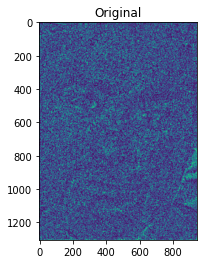

In [ ]:
tt=(np.abs(normalized_image3-normalized_image1))
A = np.double(tt)
out = np.zeros(A.shape, np.double)
normalized_image4= cv2.normalize(A, out,1, 0.0, cv2.NORM_MINMAX)
display_one(normalized_image4)


In [ ]:
hh.shape

(1305, 946)

In [ ]:
arr=np.zeros(37,dtype=float)
dataset_t=loadImagest(image_path)

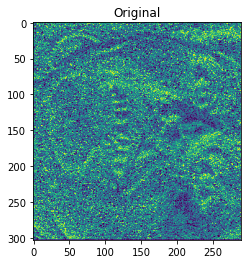

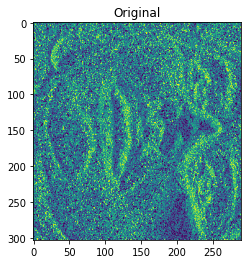

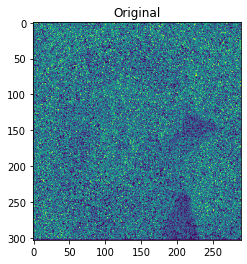

0


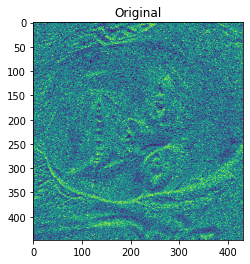

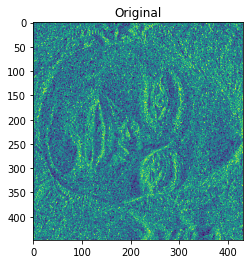

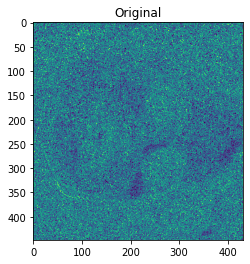

1


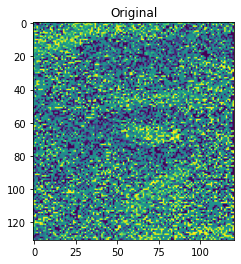

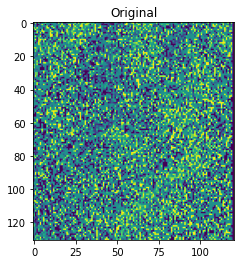

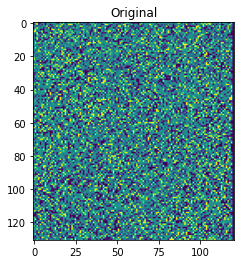

2


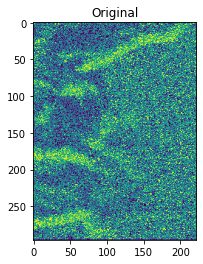

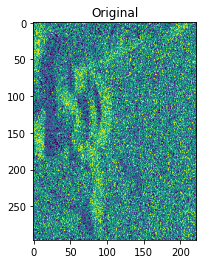

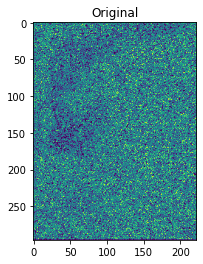

3


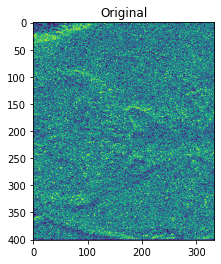

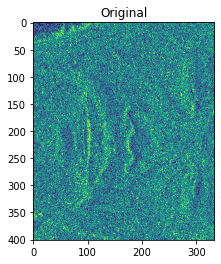

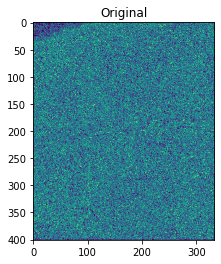

4


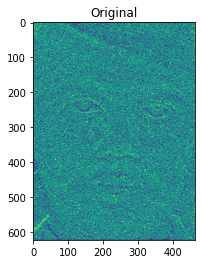

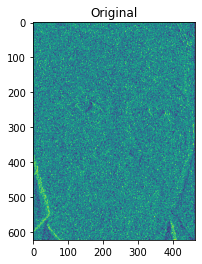

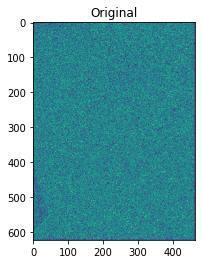

5


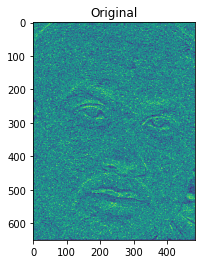

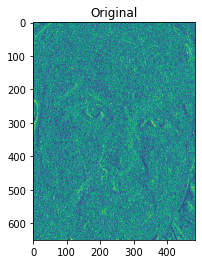

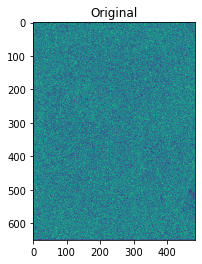

6


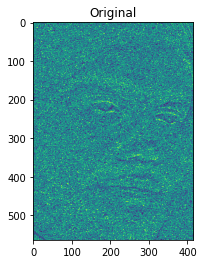

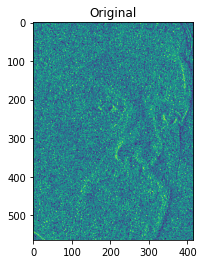

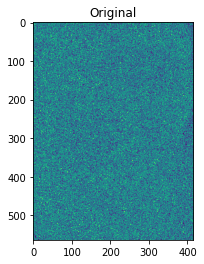

7


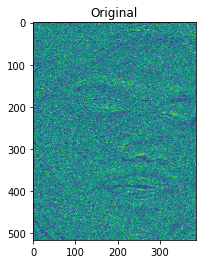

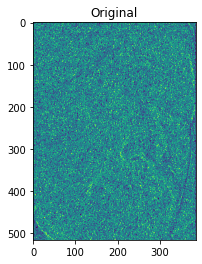

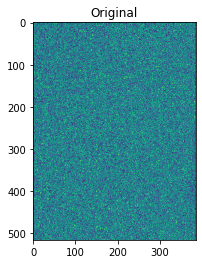

8


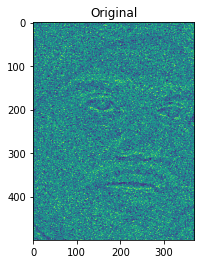

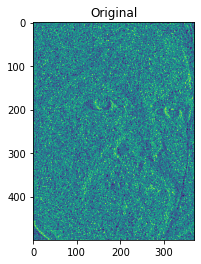

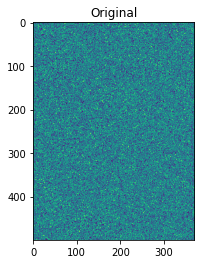

9


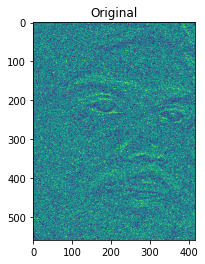

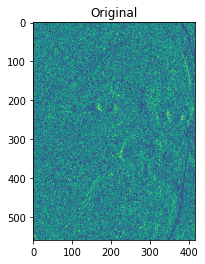

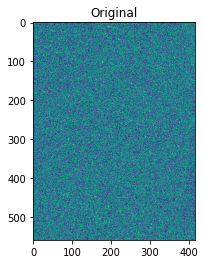

10


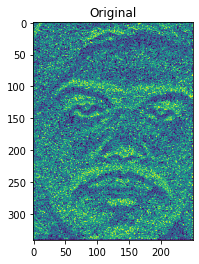

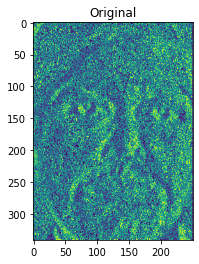

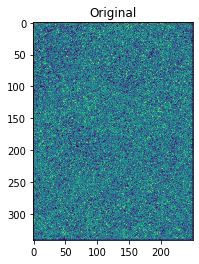

11


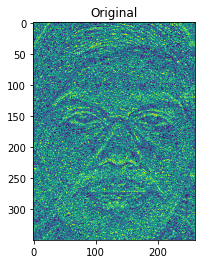

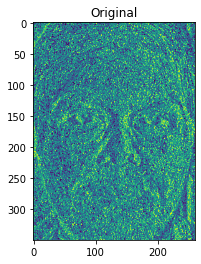

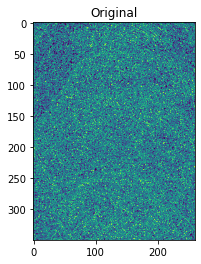

12


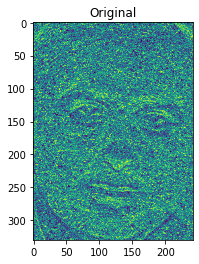

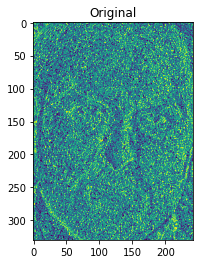

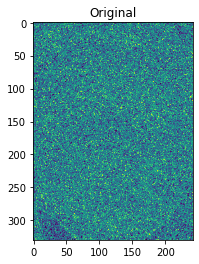

13


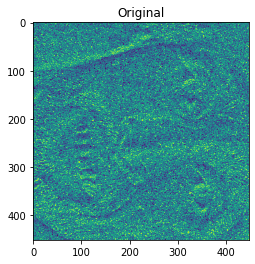

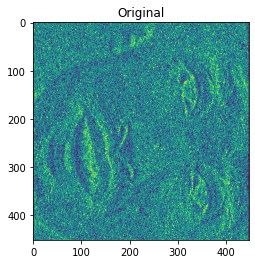

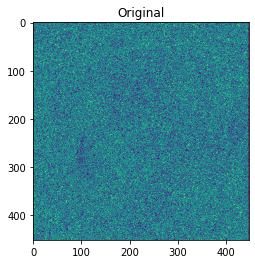

14


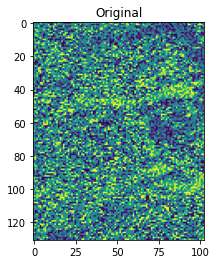

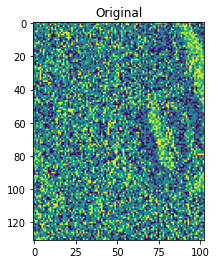

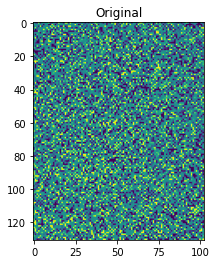

15


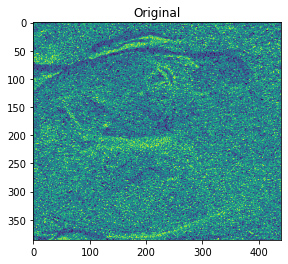

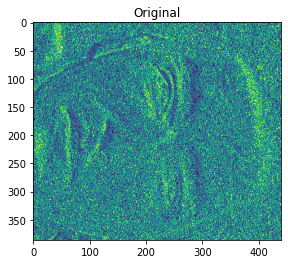

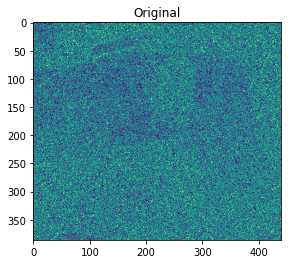

16


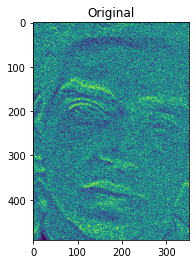

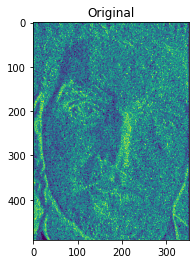

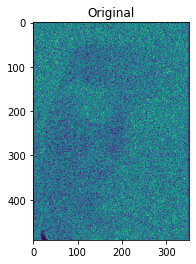

17


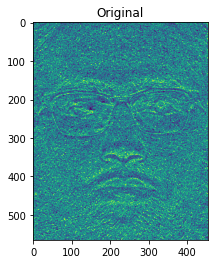

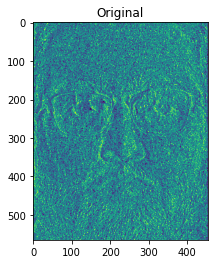

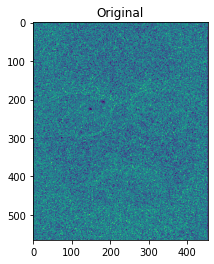

18


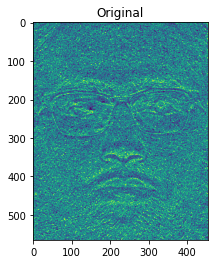

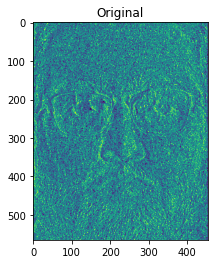

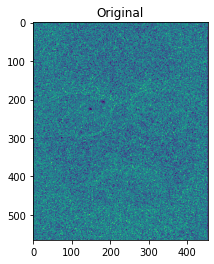

19


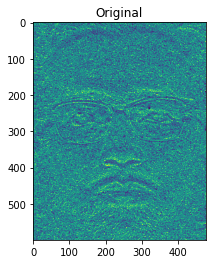

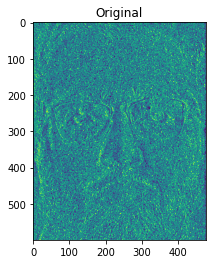

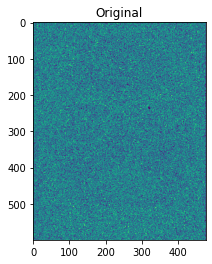

20


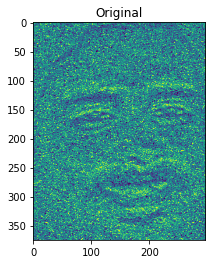

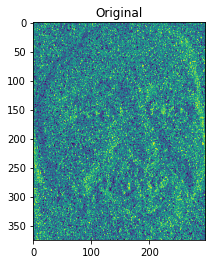

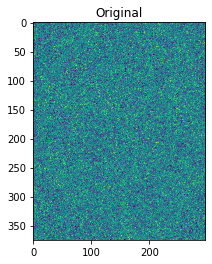

21


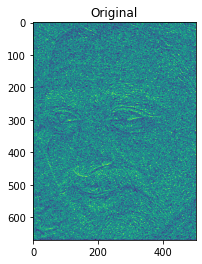

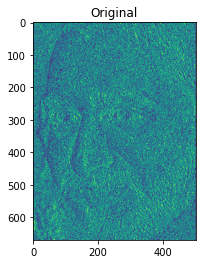

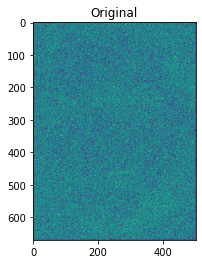

22


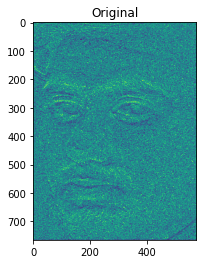

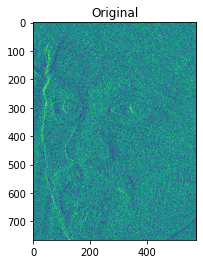

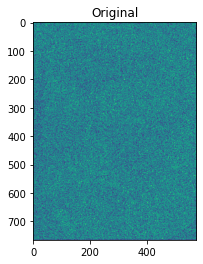

23


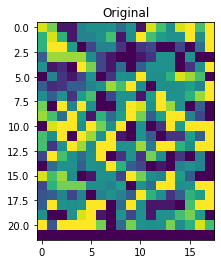

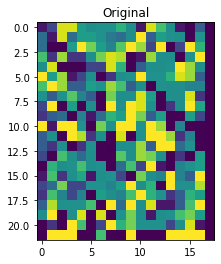

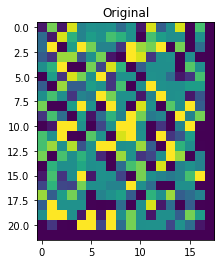

24


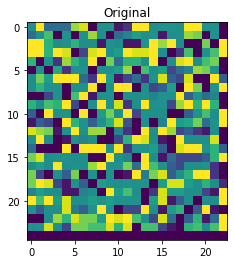

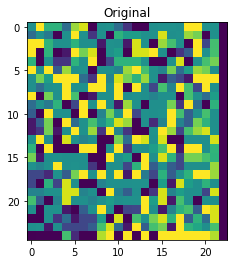

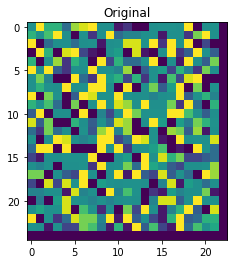

25


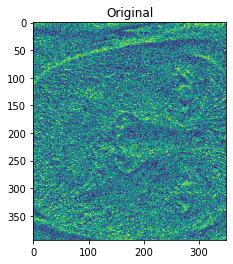

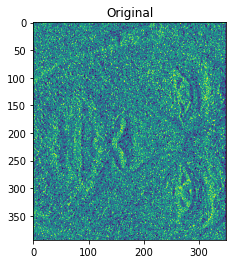

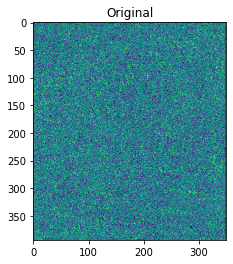

26


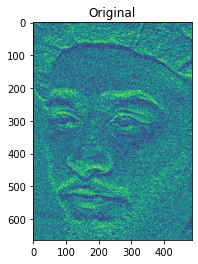

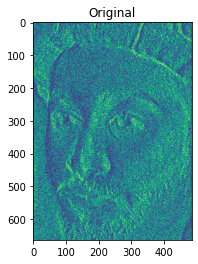

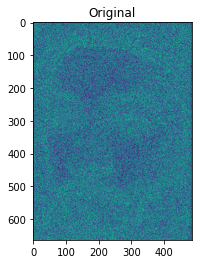

27


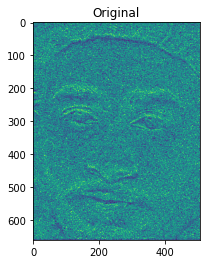

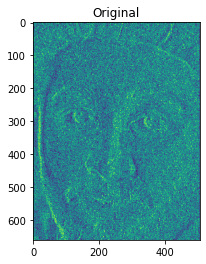

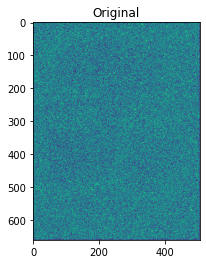

28


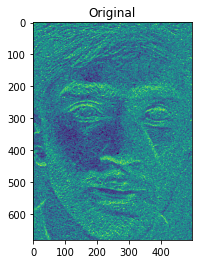

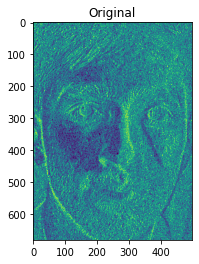

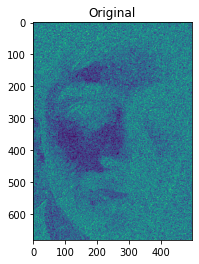

29


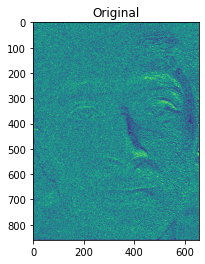

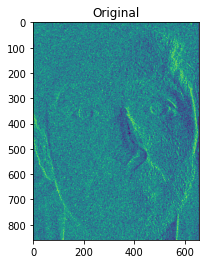

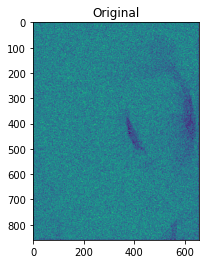

30


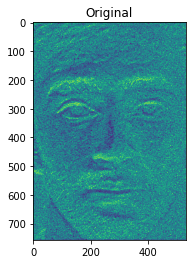

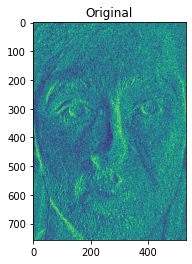

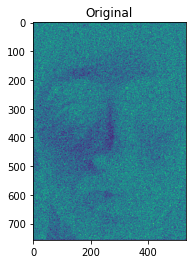

31


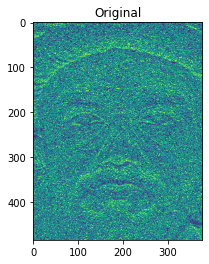

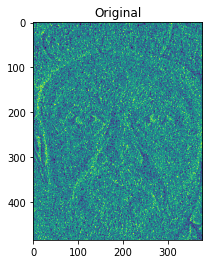

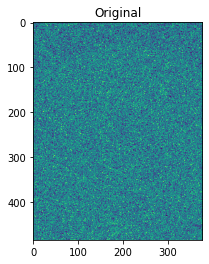

32


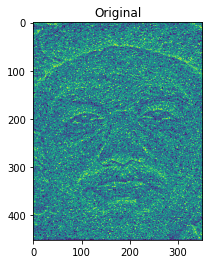

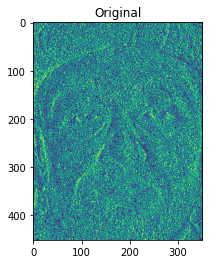

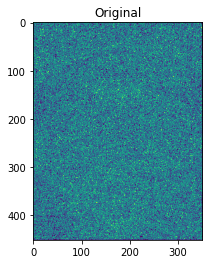

33


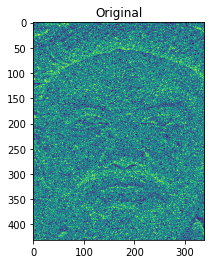

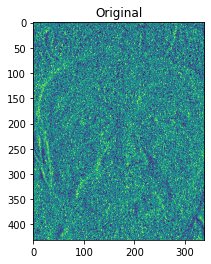

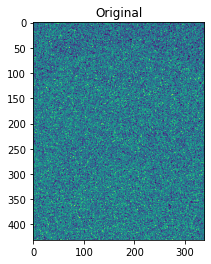

34


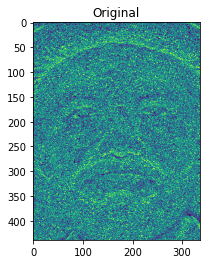

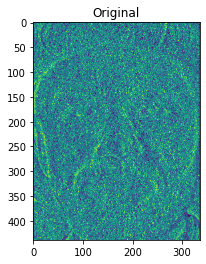

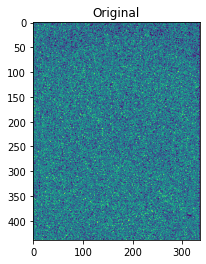

35


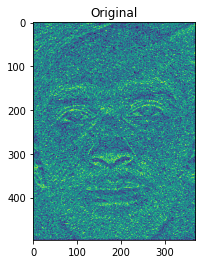

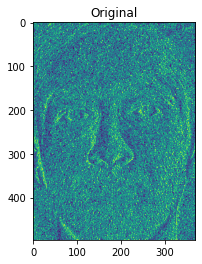

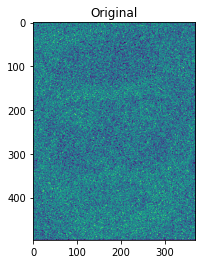

36


In [ ]:
for x in range(0,37):
  imaget=Image.open(dataset_t[x])
  image = imaget.convert('RGB')
  # convert to array
  pixels = np.asarray(image)
  # detect faces in the image
  results = detector.detect_faces(pixels)
  # extract the bounding box from the first face
  x1, y1, width, height = results[0]['box']
  w=width/100
  h=height/100
  w=w*3
  h=h*3
# bug fix
  x1, y1 = abs(int(x1-w)), abs(int(y1-h))
  x2, y2 = int(x1 + width+w),int( y1 + height+h)
  face = pixels[y1:y2, x1:x2]
  # resize pixels to the model size
  image = Image.fromarray(face)
  red, green, blue = image.split()
  coeffs2 = pywt.wavedec2(red,'haar',level=1)
  LL, (red_LH, red_HL, red_HH) = coeffs2
  coeffs2 = pywt.wavedec2(green,'haar',level=1)
  LL, (green_LH, green_HL, green_HH) = coeffs2
  coeffs2 = pywt.wavedec2(blue,'haar',level=1)
  LL, (blue_LH,blue_HL,blue_HH) = coeffs2
  LH=Image.merge('RGB',(Image.fromarray(np.uint8(red_LH*255.999)),Image.fromarray(np.uint8(green_LH*255.999)),Image.fromarray(np.uint8(blue_LH*255.999))))
  LH_GRAY=ImageOps.grayscale(LH)
  display_one(LH_GRAY)
  HL=Image.merge('RGB',(Image.fromarray(np.uint8(red_HL*255.999)),Image.fromarray(np.uint8(green_HL*255.999)),Image.fromarray(np.uint8(blue_HL*255.999))))
  HL_GRAY=ImageOps.grayscale(HL)
  display_one(HL_GRAY)
  HH=Image.merge('RGB',(Image.fromarray(np.uint8(red_HH*255.999)),Image.fromarray(np.uint8(green_HH*255.999)),Image.fromarray(np.uint8(blue_HH*255.999))))
  HH_GRAY=ImageOps.grayscale(HH)
  display_one(HH_GRAY)
  pil_image =HL_GRAY
  hl = cv2.cvtColor(np.array(pil_image), cv2.COLOR_BAYER_BG2GRAY)
  pil_image =HH_GRAY
  hh = cv2.cvtColor(np.array(pil_image), cv2.COLOR_BAYER_BG2GRAY)
  pil_image =LH_GRAY
  lh = cv2.cvtColor(np.array(pil_image), cv2.COLOR_BAYER_BG2GRAY)
  size=find_image.size
  hl=cv2.resize(hl,size, interpolation = cv2.INTER_AREA)
  hh=cv2.resize(hh,size, interpolation = cv2.INTER_AREA)
  lh=cv2.resize(lh,size, interpolation = cv2.INTER_AREA)
  tt=lh+hl+hh
  A = np.double(tt)
  out = np.zeros(A.shape, np.double)
  t_normalized_image1 = cv2.normalize(A, out,1, 0.0, cv2.NORM_MINMAX)
  tt=np.abs(lh)+np.abs(hl)+np.abs(hh)
  A = np.double(tt)
  out = np.zeros(A.shape, np.double)
  t_normalized_image2 = cv2.normalize(A, out,1, 0.0, cv2.NORM_MINMAX)
  A = np.double(lh)
  out = np.zeros(A.shape, np.double)
  s1 = cv2.normalize(A, out,1, 0.0, cv2.NORM_MINMAX)
  A = np.double(hl)
  out = np.zeros(A.shape, np.double)
  s2 = cv2.normalize(A, out,1, 0.0, cv2.NORM_MINMAX)
  A = np.double(hh)
  out = np.zeros(A.shape, np.double)
  s3 = cv2.normalize(A, out,1, 0.0, cv2.NORM_MINMAX)
  tt=s1+s2+s3
  A = np.double(tt)
  out = np.zeros(A.shape, np.double)
  t_normalized_image3= cv2.normalize(A, out,1, 0.0, cv2.NORM_MINMAX)
  tt=(np.abs(t_normalized_image3-t_normalized_image1))
  A = np.double(tt)
  out = np.zeros(A.shape, np.double)
  t_normalized_image4= cv2.normalize(A, out,1, 0.0, cv2.NORM_MINMAX)
  '''d4 = cv2.matchShapes(normalized_image4,t_normalized_image4,cv2.CONTOURS_MATCH_I2,0)
  d3 = cv2.matchShapes(normalized_image3,t_normalized_image3,cv2.CONTOURS_MATCH_I2,0)
  d2 = cv2.matchShapes(normalized_image2,t_normalized_image2,cv2.CONTOURS_MATCH_I2,0)
  d1 = cv2.matchShapes(normalized_image1,t_normalized_image1,cv2.CONTOURS_MATCH_I2,0)
  distance=d1+d2+d3+d4'''
  d1=moments_hu(normalized_image1)
  d2=moments_hu(normalized_image2)
  d3=moments_hu(normalized_image3)
  d4=moments_hu(normalized_image4)
  distanc=np.concatenate((d1,d2,d3,d4))
  d1=moments_hu(t_normalized_image1)
  d2=moments_hu(t_normalized_image2)
  d3=moments_hu(t_normalized_image3)
  d4=moments_hu(t_normalized_image4)
  t_distanc=np.concatenate((d1,d2,d3,d4))
  final_distance=distance.canberra(distanc,t_distanc)
  arr[x]=final_distance
  print(x)

In [ ]:

'''display_one(Image.open(dataset_t[37]))'''

'display_one(Image.open(dataset_t[37]))'

In [ ]:
  d1=moments_hu(normalized_image1)
  d2=moments_hu(normalized_image2)
  d3=moments_hu(normalized_image3)
  d4=moments_hu(normalized_image4)
  distanc=np.concatenate((d1,d2,d3,d4))
  d1=moments_hu(t_normalized_image1)
  d2=moments_hu(t_normalized_image2)
  d3=moments_hu(t_normalized_image3)
  d4=moments_hu(t_normalized_image4)
  t_distanc=np.concatenate((d1,d2,d3,d4))
  v=distance.canberra(distanc,t_distanc)

  v.shape

()

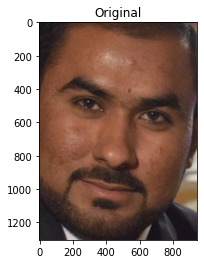

In [ ]:
display_one(find_image)

In [ ]:
index=np.argmin(arr)


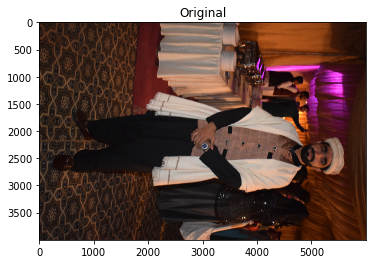

In [ ]:
image=Image.open(dataset_t[index])
display_one(image)


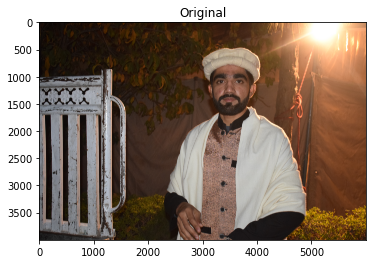

In [ ]:
image=Image.open(dataset_t[32])
display_one(image)

In [ ]:
arr

array([11.04852815, 12.43879761, 16.73951354, 11.37666923, 13.25575756,
        7.87872433, 15.40082906, 15.05095815, 13.3476319 , 16.03137822,
       14.06843223, 13.52295388, 12.10856005,  4.6616158 , 11.53037542,
       11.18369982, 17.95661887, 11.44700685, 11.76904512, 11.76904512,
       15.50143694, 11.8839618 , 21.49522146, 13.66098516, 10.96958049,
        3.73380456, 17.53749101, 16.93965145, 17.81591035, 13.74762029,
       15.26277666, 20.42770072, 14.35384015, 13.02538838, 14.37771152,
       15.39068165, 11.75023906])

In [ ]:
v=arr[arr<1.33]
v

array([], dtype=float64)

In [ ]:
arr

array([11.04852815, 12.43879761, 16.73951354, 11.37666923, 13.25575756,
        7.87872433, 15.40082906, 15.05095815, 13.3476319 , 16.03137822,
       14.06843223, 13.52295388, 12.10856005,  4.6616158 , 11.53037542,
       11.18369982, 17.95661887, 11.44700685, 11.76904512, 11.76904512,
       15.50143694, 11.8839618 , 21.49522146, 13.66098516, 10.96958049,
        3.73380456, 17.53749101, 16.93965145, 17.81591035, 13.74762029,
       15.26277666, 20.42770072, 14.35384015, 13.02538838, 14.37771152,
       15.39068165, 11.75023906])

In [ ]:
index

25